# Uploading of files

In [1]:
# Cell 1
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import io
import os
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import random
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import load_model
from keras.utils import custom_object_scope
from datetime import datetime, timedelta
import shutil
import traceback
import time

# Pre process files

Starting preprocessing...
Processing file 1...
Processing file 2...
Processing file 3...
Processing file 4...
Processing file 5...
Processing file 6...
Processing file 7...
Processing file 8...
Processing file 9...
Processing file 10...
Processing file 11...
Processing file 12...
Processing file 13...
Processing file 14...
Processing file 15...
Processing file 16...
Processing file 17...
Processing file 18...
Processing file 19...
Processing file 20...


C:\Users\Grimes\AppData\Local\Temp\ipykernel_9664\261948269.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


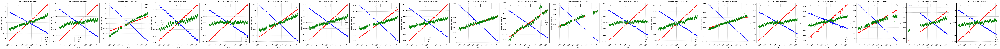


Processing Summary:
Number of processed files: 20
Average data points: 5525
Processing completed successfully!


In [ ]:
def create_output_directories():
    """Create directories for original and preprocessed data"""
    current_dir = os.getcwd()
    original_dir = os.path.join(current_dir, 'files', 'original_absolute')
    preprocessed_dir = os.path.join(current_dir, 'files', 'pre_processed_data')
    
    if not os.path.exists(original_dir):
        os.makedirs(original_dir)
    if not os.path.exists(preprocessed_dir):
        os.makedirs(preprocessed_dir)
    
    return original_dir, preprocessed_dir

# Plot GPS according to NGL format
def plot_gps_data(df, filename, ax):
    """Plot GPS time series in NGL style but combined"""
    # Calculate mean positions to demean the data
    east_mean = df['__east(m)'].mean()
    north_mean = df['_north(m)'].mean()
    up_mean = df['____up(m)'].mean()
    
    # Create datetime index for better x-axis
    df['date'] = pd.to_datetime(df['YYMMMDD'], format='%y%b%d')
    
    # Plot components with small dots
    ax.scatter(df['date'], df['__east(m)'] - east_mean, 
              c='blue', s=2, alpha=0.6, label='East')
    ax.scatter(df['date'], df['_north(m)'] - north_mean, 
              c='red', s=2, alpha=0.6, label='North')
    ax.scatter(df['date'], df['____up(m)'] - up_mean, 
              c='green', s=2, alpha=0.6, label='Up')
    
    # Customize plot
    ax.set_title(f'GPS Time Series: {filename}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Demeaned Position (m)')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.legend()
    
    # Rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=45)
    
    # Add statistical information
    stats_text = (f'Mean (m) - East: {east_mean:.3f}, North: {north_mean:.3f}, Up: {up_mean:.3f}\n'
                 f'RMS (m) - East: {np.sqrt(np.mean((df["__east(m)"] - east_mean)**2)):.3f}, '
                 f'North: {np.sqrt(np.mean((df["_north(m)"] - north_mean)**2)):.3f}, '
                 f'Up: {np.sqrt(np.mean((df["____up(m)"] - up_mean)**2)):.3f}')
    
    ax.text(0.02, 0.95, stats_text,
            transform=ax.transAxes,
            fontsize=8,
            verticalalignment='top',
            bbox=dict(facecolor='white', alpha=0.8))

def upload_and_process_files(directory, num_files_to_use=None):
    """Process GPS files following SC-BETA-VAE-GAN methodology"""
    tenv3_files = [f for f in os.listdir(directory) if f.endswith(".tenv3")]
    
    if num_files_to_use:
        tenv3_files = tenv3_files[:num_files_to_use]
    
    num_files = len(tenv3_files)
    if num_files == 0:
        raise ValueError(f"No .tenv3 files found in {directory}")
    
    data_frames = []
    original_data_frames = []
    processed_data = []
    scalers = []
    input_filenames = []
    
    original_dir = 'files/original_absolute'
    preprocessed_dir = 'files/pre_processed_data'
    os.makedirs(original_dir, exist_ok=True)
    os.makedirs(preprocessed_dir, exist_ok=True)
    
    # Setup plotting
    fig, axs = plt.subplots(1, num_files, figsize=(6*num_files, 6), constrained_layout=True)
    if num_files == 1:
        axs = [axs]
    
    for i, filename in enumerate(tenv3_files):
        print(f"Processing file {i+1}...")
        file_path = os.path.join(directory, filename)
        input_filenames.append(filename)
        
        # Read header and data
        with open(file_path, 'r') as f:
            header = f.readline().strip()
        column_names = header.split()
        df = pd.read_csv(file_path, skiprows=1, sep=r'\s+', names=column_names)
        
        # Save original data
        original_data_frames.append(df.copy())
        data_frames.append(df.copy())
        
        # Save to original_absolute folder
        original_filename = os.path.join(original_dir, f"original_{filename}")
        df.to_csv(original_filename, sep=' ', index=False, header=False)
        
        # Process coordinates
        coordinates = df[['__east(m)', '_north(m)', '____up(m)']].values
        scaler = MinMaxScaler()
        normalized_coords = scaler.fit_transform(coordinates)
        scalers.append(scaler)
        
        # Store processed data (this is what we'll use for training)
        processed_data.append(normalized_coords)
        
        # Save preprocessed data
        processed_df = pd.DataFrame(
            normalized_coords,
            columns=['east_normalized', 'north_normalized', 'up_normalized']
        )
        preprocessed_filename = os.path.join(preprocessed_dir, f"preprocessed_{filename}")
        processed_df.to_csv(preprocessed_filename, sep=' ', index=False, header=False)
        
        plot_gps_data(df, filename, axs[i])
    
    plt.tight_layout()
    plt.show()
    
    avg_data_points = int(np.mean([len(data) for data in processed_data]))
    
    return data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames

# Execution
print("Starting preprocessing...")
try:
    input_dir = os.path.join('dataset', 'train')
    data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames = upload_and_process_files(input_dir)
    
    print(f"\nProcessing Summary:")
    print(f"Number of processed files: {len(processed_data)}")
    print(f"Average data points: {avg_data_points}")
    print("Processing completed successfully!")
    
except Exception as e:
    print(f"An error occurred: {str(e)}")
    import traceback
    print("\nFull error traceback:")
    print(traceback.format_exc())

# Enhancing processed data

> The purpose of this function is to ensure that it considers not only the coordinates but the other properties as well before the next step.

In [12]:
def safe_normalize(values):
    """
    Safely normalize values, handling cases where min and max are the same
    """
    min_val = np.min(values)
    max_val = np.max(values)
    if min_val == max_val:
        return np.zeros_like(values)  # Return zeros if no variation
    return (values - min_val) / (max_val - min_val)

def enhance_gps_quality(processed_data, original_data_frames, maintain_scbeta=True):
    """
    Enhanced quality function with safe normalization and debugging
    """
    enhanced_data = []
    
    for idx, (proc_data, orig_df) in enumerate(zip(processed_data, original_data_frames)):
        print(f"\nProcessing dataset {idx}")
        
        # Debug original values
        print(f"Original e0 range: [{orig_df['_e0(m)'].min()}, {orig_df['_e0(m)'].max()}]")
        print(f"Original n0 range: [{orig_df['____n0(m)'].min()}, {orig_df['____n0(m)'].max()}]")
        print(f"Original u0 range: [{orig_df['u0(m)'].min()}, {orig_df['u0(m)'].max()}]")
        
        # Extract measurement quality
        quality_metrics = {
            'uncertainties': {
                'east': orig_df['sig_e(m)'].values,
                'north': orig_df['sig_n(m)'].values,
                'up': orig_df['sig_u(m)'].values
            },
            'correlations': {
                'en': orig_df['__corr_en'].values,
                'eu': orig_df['__corr_eu'].values,
                'nu': orig_df['__corr_nu'].values
            }
        }
        
        # Calculate normalized reference coordinates using safe normalization
        reference_coords = {
            'east': safe_normalize(orig_df['_e0(m)'].values),
            'north': safe_normalize(orig_df['____n0(m)'].values),
            'up': safe_normalize(orig_df['u0(m)'].values)
        }
        
        print("\nReference coordinate ranges after normalization:")
        print(f"East: [{reference_coords['east'].min()}, {reference_coords['east'].max()}]")
        print(f"North: [{reference_coords['north'].min()}, {reference_coords['north'].max()}]")
        print(f"Up: [{reference_coords['up'].min()}, {reference_coords['up'].max()}]")
        
        # Calculate quality weights with adjusted scaling
        uncertainty_matrix = np.column_stack([
            quality_metrics['uncertainties']['east'],
            quality_metrics['uncertainties']['north'],
            quality_metrics['uncertainties']['up']
        ])
        
        # Safe normalization for uncertainties
        uncertainty_matrix = np.apply_along_axis(safe_normalize, 0, uncertainty_matrix)
        weights = 1 - uncertainty_matrix
        
        print("\nWeight ranges:")
        print(f"East weights: [{weights[:, 0].min()}, {weights[:, 0].max()}]")
        print(f"North weights: [{weights[:, 1].min()}, {weights[:, 1].max()}]")
        print(f"Up weights: [{weights[:, 2].min()}, {weights[:, 2].max()}]")
        
        # Get correlation matrix
        correlation_matrix = np.array([
            quality_metrics['correlations']['en'],
            quality_metrics['correlations']['eu'],
            quality_metrics['correlations']['nu']
        ])
        
        # Enhance coordinates
        enhanced_coords = proc_data.copy()
        
        if maintain_scbeta:
            reference_arrays = [
                reference_coords['east'],
                reference_coords['north'],
                reference_coords['up']
            ]
            
            for i in range(3):
                enhanced_coords[:, i] = enhance_coordinate(
                    enhanced_coords[:, i],
                    weights[:, i],
                    correlation_matrix[i],
                    reference_arrays[i]
                )
                
                print(f"\nComponent {i} enhancement results:")
                print(f"Original range: [{proc_data[:, i].min()}, {proc_data[:, i].max()}]")
                print(f"Enhanced range: [{enhanced_coords[:, i].min()}, {enhanced_coords[:, i].max()}]")
        
        # Validate with debugging
        validation_result = validate_gps_coordinates(enhanced_coords, orig_df, debug=True)
        
        if validation_result:
            print(f"Dataset {idx}: Enhancement successful")
            enhanced_data.append(enhanced_coords)
        else:
            print(f"Warning: Enhancement validation failed for dataset {idx}, using original data")
            enhanced_data.append(proc_data)
    
    return enhanced_data

def validate_gps_coordinates(coords, orig_df, debug=False):
    """
    Validate coordinates with debugging
    """
    if debug:
        print("\nValidation Results:")
        print(f"Coordinate range: [{coords.min()}, {coords.max()}]")
        
    # Range validation
    range_valid = np.all(coords >= -0.1) and np.all(coords <= 1.1)
    if debug:
        print(f"Range validation: {range_valid}")
    
    # Jump validation
    jump_threshold = 0.15
    jumps = np.abs(np.diff(coords, axis=0))
    max_jump = np.max(jumps)
    jumps_valid = np.all(jumps < jump_threshold)
    
    if debug:
        print(f"Maximum jump: {max_jump}")
        print(f"Jump validation: {jumps_valid}")
    
    # Time series validation
    time_series_valid = validate_time_series(coords)
    if debug:
        print(f"Time series validation: {time_series_valid}")
    
    return range_valid and jumps_valid and time_series_valid

# def validate_time_series(coords):
#     """
#     Validate temporal consistency with debugging
#     """
#     max_allowed_jump = 3 * np.std(coords, axis=0)
#     jumps = np.abs(np.diff(coords, axis=0))
    
#     valid = np.all(jumps < max_allowed_jump)
#     if not valid:
#         print(f"Max allowed jump: {max_allowed_jump}")
#         print(f"Actual max jump: {np.max(jumps, axis=0)}")
    
#     return valid

# Add debugging to enhance_coordinate function
def enhance_coordinate(coord, weights, correlations, reference):
    """
    Enhanced coordinate processing with adjusted deviation handling
    """
    # Apply weight-based smoothing
    weighted_coord = coord * weights
    
    # Compare with normalized reference
    ref_diff = np.abs(weighted_coord - reference)
    
    # Use more lenient threshold for large deviations (5 std instead of 3)
    large_deviations = ref_diff > np.std(ref_diff) * 5
    
    if np.any(large_deviations):
        weighted_coord[large_deviations] = (
            weighted_coord[large_deviations] * 0.8 +  # Increased weight for original value
            coord[large_deviations] * 0.2
        )
    
    return weighted_coord

def validate_time_series(coords):
    """
    Validate temporal consistency with adjusted threshold
    """
    max_allowed_jump = 5 * np.std(coords, axis=0)  # Increased from 3 to 5
    jumps = np.abs(np.diff(coords, axis=0))
    
    return np.all(jumps < max_allowed_jump)

print("Original data statistics:")
print(f"Shape: {processed_data[0].shape}")
print(f"Range: [{processed_data[0].min()}, {processed_data[0].max()}]")

processed_data = enhance_gps_quality(processed_data, original_data_frames)

Original data statistics:
Shape: (5686, 3)
Range: [0.0, 1.0000000000000002]

Processing dataset 0
Original e0 range: [512, 512]
Original n0 range: [8833621, 8833621]
Original u0 range: [484, 484]

Reference coordinate ranges after normalization:
East: [0, 0]
North: [0, 0]
Up: [0, 0]

Weight ranges:
East weights: [0.0, 1.0]
North weights: [0.0, 1.0]
Up weights: [0.0, 1.0]

Component 0 enhancement results:
Original range: [0.0, 1.0]
Enhanced range: [0.0, 0.9055162350015519]

Component 1 enhancement results:
Original range: [0.0, 1.0000000000000002]
Enhanced range: [0.0, 0.97828060422852]

Component 2 enhancement results:
Original range: [0.0, 1.0000000000000002]
Enhanced range: [0.0, 0.9516142185664065]

Validation Results:
Coordinate range: [0.0, 0.97828060422852]
Range validation: True
Maximum jump: 0.672117720358262
Jump validation: False
Time series validation: True

Processing dataset 1
Original e0 range: [1737, 1737]
Original n0 range: [7968309, 7968309]
Original u0 range: [1494, 1

# Gap Identification

In [13]:
def identify_gaps(df, filename):
    """
    Identify gaps and missing coordinates in GPS time series data
    Args:
        df: DataFrame containing GPS data
        filename: Name of the GPS station file
    Returns:
        gaps_info: Dictionary containing gap and missing data information
    """
    # Convert dates to datetime
    df['date'] = pd.to_datetime(df['YYMMMDD'], format='%y%b%d')
    
    # Sort by date
    df = df.sort_values('date')
    
    # Identify missing coordinates
    missing_coords = df[df['__east(m)'].isna() & 
                       df['_north(m)'].isna() & 
                       df['____up(m)'].isna()]
    
    # Calculate time differences between consecutive measurements
    df['days_diff'] = df['date'].diff().dt.days
    
    # Identify gaps (where difference > 1 day)
    gaps = df[df['days_diff'] > 1].copy()
    
    # Store gap and missing data information
    gaps_info = {
        'station': filename,
        'total_gaps': len(gaps),
        'total_gap_days': gaps['days_diff'].sum() - len(gaps),
        'missing_coordinates_dates': missing_coords['YYMMMDD'].tolist(),
        'total_missing_coordinates': len(missing_coords),
        'gap_ranges': [],
        'gap_statistics': {}
    }
    
    if len(gaps) > 0:
        # Record each gap's details
        for idx, row in gaps.iterrows():
            prev_date = df.loc[idx-1, 'date']
            gap_length = row['days_diff'] - 1
            gaps_info['gap_ranges'].append({
                'start_date': prev_date.strftime('%Y-%m-%d'),
                'end_date': row['date'].strftime('%Y-%m-%d'),
                'length': gap_length
            })
        
        # Calculate gap statistics
        gap_lengths = [g['length'] for g in gaps_info['gap_ranges']]
        gaps_info['gap_statistics'] = {
            'min_length': min(gap_lengths),
            'max_length': max(gap_lengths),
            'mean_length': np.mean(gap_lengths),
            'median_length': np.median(gap_lengths)
        }
        
        # Categorize gaps
        gaps_info['gap_categories'] = {
            'short': len([g for g in gap_lengths if g <= 7]),
            'medium': len([g for g in gap_lengths if 7 < g <= 30]),
            'long': len([g for g in gap_lengths if g > 30])
        }
    
    return gaps_info, df

def fill_identified_gaps(df, gaps_info):
    """
    Fill both gaps and missing coordinates in GPS time series data.
    Args:
        df: DataFrame with GPS data
        gaps_info: Dictionary containing gap information from identify_gaps
    Returns:
        DataFrame with filled gaps and interpolated coordinates
    """
    df = df.copy()
    new_rows = []
    
    # First report missing coordinates
    if gaps_info['total_missing_coordinates'] > 0:
        print(f"\nDates with missing coordinates:")
        for date in gaps_info['missing_coordinates_dates']:
            print(f"  {date}")
    
    # Then handle gaps between dates
    if gaps_info['total_gaps'] > 0:
        print(f"\nGaps between dates:")
        for gap in gaps_info['gap_ranges']:
            print(f"  {gap['start_date']} to {gap['end_date']} ({gap['length']} days)")
            
            # Create rows for missing days
            start_date = pd.to_datetime(gap['start_date'])
            end_date = pd.to_datetime(gap['end_date'])
            
            date_range = pd.date_range(start_date + pd.Timedelta(days=1), 
                                     end_date - pd.Timedelta(days=1),
                                     freq='D')
            
            for date in date_range:
                new_row = {
                    'date': date,
                    'YYMMMDD': date.strftime('%y%b%d').upper(),
                    '__east(m)': np.nan,
                    '_north(m)': np.nan,
                    '____up(m)': np.nan
                }
                new_rows.append(new_row)
    
    # Add new rows and sort
    if new_rows:
        df_new = pd.DataFrame(new_rows)
        df = pd.concat([df, df_new], ignore_index=True)
    
    # Sort by date and interpolate all missing values
    df = df.sort_values('date')
    for col in ['__east(m)', '_north(m)', '____up(m)']:
        df[col] = df[col].interpolate(method='linear')
    
    return df

def process_and_fill_gaps(data_frames, input_filenames):
    """Process gaps and missing coordinates for all GPS stations."""
    processed_frames = []
    gaps_summary = []
    
    for df, filename in zip(data_frames, input_filenames):
        print(f"\nProcessing {filename}")
        
        # Identify gaps and missing coordinates
        gaps_info, df_with_dates = identify_gaps(df.copy(), filename)
        gaps_summary.append(gaps_info)
        
        # Fill gaps and interpolate coordinates
        processed_df = fill_identified_gaps(df_with_dates, gaps_info)
        processed_frames.append(processed_df)
        
        # Print summary
        print(f"Original points: {len(df)}")
        print(f"Missing coordinates: {gaps_info['total_missing_coordinates']}")
        print(f"Gaps: {gaps_info['total_gaps']}")
        print(f"Total gap days: {gaps_info['total_gap_days']}")
        print(f"Final points after filling: {len(processed_df)}")
        
    return processed_frames, gaps_summary

def save_processed_gps(processed_frames, input_filenames):
    """Save processed GPS data to imputed folder."""
    imputed_folder = 'imputed'
    os.makedirs(imputed_folder, exist_ok=True)
    
    for filename, df in zip(input_filenames, processed_frames):
        # Round coordinates to maintain precision
        cols = ['__east(m)', '_north(m)', '____up(m)']
        df[cols] = df[cols].round(6)
        
        # Save with original GPS data format
        save_path = os.path.join(imputed_folder, filename)
        df[['YYMMMDD'] + cols].to_csv(save_path, sep=' ', index=False, header=False)
        print(f"Processed data saved as: {filename}")

# Usage:
processed_frames, gaps_summary = process_and_fill_gaps(data_frames, input_filenames)
save_processed_gps(processed_frames, input_filenames)


Processing BLAS.tenv3

Gaps between dates:
  2012-03-24 to 2012-09-01 (160.0 days)
  2014-06-05 to 2014-08-21 (76.0 days)
  2020-12-23 to 2020-12-25 (1.0 days)
  2023-11-21 to 2023-11-23 (1.0 days)
  2023-12-18 to 2023-12-20 (1.0 days)
  2024-04-09 to 2024-04-11 (1.0 days)
  2024-07-23 to 2024-07-25 (1.0 days)
Original points: 5686
Missing coordinates: 0
Gaps: 7
Total gap days: 241.0
Final points after filling: 5927

Processing DGJG.tenv3

Gaps between dates:
  2012-07-09 to 2012-07-12 (2.0 days)
  2018-05-12 to 2018-05-14 (1.0 days)
  2020-03-24 to 2020-03-26 (1.0 days)
  2022-06-21 to 2022-06-23 (1.0 days)
  2023-10-18 to 2023-10-20 (1.0 days)
Original points: 5521
Missing coordinates: 0
Gaps: 5
Total gap days: 6.0
Final points after filling: 5527

Processing DKSG.tenv3

Gaps between dates:
  2007-09-05 to 2007-09-07 (1.0 days)
  2011-01-02 to 2011-03-04 (60.0 days)
  2011-03-05 to 2011-03-07 (1.0 days)
  2011-03-08 to 2011-03-10 (1.0 days)
  2011-03-22 to 2011-03-24 (1.0 days)
  20

# Model Creation

In [ ]:
class VAE(tf.keras.Model):
    def __init__(self, latent_dim, beta=1.0, lambda_shift=0.01, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.latent_dim = latent_dim
        self.beta = beta
        self.lambda_shift = lambda_shift
        
        # Encoder
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(3,)),  # east, north, up
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(latent_dim * 2)
        ])
        
        # Decoder
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(3)  # east, north, up
        ])

    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * 0.5) + (mean + self.lambda_shift * tf.exp(logvar * 0.5))

    def decode(self, z):
        decoded = self.decoder(z)
        return tf.sigmoid(decoded)

    def call(self, inputs):
        mean, logvar = self.encode(inputs)
        z = self.reparameterize(mean, logvar)
        return self.decode(z), mean, logvar

    @classmethod
    def from_config(cls, config):
        config.pop('trainable', None)
        config.pop('dtype', None)
        return cls(**config)

    def get_config(self):
        config = super(VAE, self).get_config()
        config.update({
            'latent_dim': self.latent_dim,
            'beta': self.beta,
            'lambda_shift': self.lambda_shift
        })
        return config

class LSTMDiscriminator(tf.keras.Model):
    def __init__(self):
        super(LSTMDiscriminator, self).__init__()
        self.model = Sequential()
        self.model.add(LSTM(64, return_sequences=True, input_shape=(None, 3)))
        self.model.add(LSTM(32))
        self.model.add(Dense(1, activation='sigmoid'))

    def call(self, x):
        return self.model(x)

def compute_loss(model, x):
    """Compute VAE loss following original structure"""
    x_reconstructed, mean, logvar = model(x)
    
    reconstruction_loss = tf.reduce_mean(tf.keras.losses.mse(x, x_reconstructed))
    
    kl_loss = -0.5 * tf.reduce_mean(1 + logvar - tf.square(mean) - tf.exp(logvar))
    
    return reconstruction_loss, kl_loss, model.beta * kl_loss

latent_dim = 1024
beta = 0.000001
learning_rate = 0.001
lambda_shift = 0.5

# Initialize models
vae = VAE(latent_dim, beta, lambda_shift)
lstm_discriminator = LSTMDiscriminator()

# Optimizers
optimizer = tf.keras.optimizers.Adam(learning_rate)
lstm_optimizer = tf.keras.optimizers.Adam(learning_rate)

c:\Users\Grimes\OneDrive\Desktop\tryyy\.venv\Lib\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(
c:\Users\Grimes\OneDrive\Desktop\tryyy\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


# Augmentation Function

In [ ]:
def generate_augmented_data(model, num_augmented_files, avg_data_points, processed_data, 
                          base_latent_variability=1.0, latent_variability_range=(0.5, 2.0)):
    augmented_datasets = []
    num_input_files = len(processed_data)
    
    for i in range(num_augmented_files):
        # Select input data
        selected_data = processed_data[i % num_input_files]
        
        # Apply latent variability
        latent_variability = base_latent_variability * np.random.uniform(
            latent_variability_range[0], latent_variability_range[1]
        )
        
        # Generate new data through VAE
        mean, logvar = model.encode(tf.convert_to_tensor(selected_data, dtype=tf.float32))
        z = model.reparameterize(mean, logvar * latent_variability)
        augmented_data = model.decode(z).numpy()
        
        # Ensure coordinates stay within realistic bounds
        augmented_data = np.clip(augmented_data, 0, 1)  # Since we're using normalized coordinates
        
        augmented_datasets.append(augmented_data)
    
    return augmented_datasets

# Train Model

Epoch 1/100: 100%|██████████| 228/228 [00:17<00:00, 13.17batch/s, Generator Loss=0.0104, Reconstruction Loss=0.0104, KL Loss=0.0757]  


Epoch 1: Generator Loss = 0.035830, Reconstruction Loss = 0.035830, KL Divergence Loss = 0.053570


Epoch 2/100: 100%|██████████| 228/228 [00:03<00:00, 57.75batch/s, Generator Loss=0.00971, Reconstruction Loss=0.00971, KL Loss=0.108] 


Epoch 2: Generator Loss = 0.017022, Reconstruction Loss = 0.017022, KL Divergence Loss = 0.094811


Epoch 3/100: 100%|██████████| 228/228 [00:03<00:00, 59.19batch/s, Generator Loss=0.00952, Reconstruction Loss=0.00952, KL Loss=0.158] 


Epoch 3: Generator Loss = 0.015440, Reconstruction Loss = 0.015440, KL Divergence Loss = 0.131096


Epoch 4/100: 100%|██████████| 228/228 [00:03<00:00, 57.52batch/s, Generator Loss=0.0101, Reconstruction Loss=0.0101, KL Loss=0.198]  


Epoch 4: Generator Loss = 0.014821, Reconstruction Loss = 0.014821, KL Divergence Loss = 0.184331


Epoch 5/100: 100%|██████████| 228/228 [00:03<00:00, 60.82batch/s, Generator Loss=0.00743, Reconstruction Loss=0.00743, KL Loss=0.26] 


Epoch 5: Generator Loss = 0.013850, Reconstruction Loss = 0.013850, KL Divergence Loss = 0.219240


Epoch 6/100: 100%|██████████| 228/228 [00:03<00:00, 60.41batch/s, Generator Loss=0.00857, Reconstruction Loss=0.00857, KL Loss=0.307]


Epoch 6: Generator Loss = 0.013255, Reconstruction Loss = 0.013255, KL Divergence Loss = 0.268236


Epoch 7/100: 100%|██████████| 228/228 [00:03<00:00, 61.53batch/s, Generator Loss=0.0077, Reconstruction Loss=0.0077, KL Loss=0.288]   


Epoch 7: Generator Loss = 0.012392, Reconstruction Loss = 0.012392, KL Divergence Loss = 0.314063


Epoch 8/100: 100%|██████████| 228/228 [00:03<00:00, 61.05batch/s, Generator Loss=0.00529, Reconstruction Loss=0.00529, KL Loss=0.422] 


Epoch 8: Generator Loss = 0.006318, Reconstruction Loss = 0.006318, KL Divergence Loss = 0.398120


Epoch 9/100: 100%|██████████| 228/228 [00:03<00:00, 59.79batch/s, Generator Loss=0.00227, Reconstruction Loss=0.00227, KL Loss=0.515]  


Epoch 9: Generator Loss = 0.002653, Reconstruction Loss = 0.002653, KL Divergence Loss = 0.381682


Epoch 10/100: 100%|██████████| 228/228 [00:03<00:00, 58.71batch/s, Generator Loss=0.00159, Reconstruction Loss=0.00159, KL Loss=0.598]  


Epoch 10: Generator Loss = 0.001563, Reconstruction Loss = 0.001563, KL Divergence Loss = 0.436530


Epoch 11/100: 100%|██████████| 228/228 [00:03<00:00, 60.65batch/s, Generator Loss=0.00125, Reconstruction Loss=0.00125, KL Loss=0.672]  


Epoch 11: Generator Loss = 0.001538, Reconstruction Loss = 0.001538, KL Divergence Loss = 0.497186


Epoch 12/100: 100%|██████████| 228/228 [00:04<00:00, 56.67batch/s, Generator Loss=0.000791, Reconstruction Loss=0.000791, KL Loss=0.696]


Epoch 12: Generator Loss = 0.001399, Reconstruction Loss = 0.001399, KL Divergence Loss = 0.552488


Epoch 13/100: 100%|██████████| 228/228 [00:04<00:00, 50.00batch/s, Generator Loss=0.000585, Reconstruction Loss=0.000585, KL Loss=0.737]


Epoch 13: Generator Loss = 0.001329, Reconstruction Loss = 0.001329, KL Divergence Loss = 0.606672


Epoch 14/100: 100%|██████████| 228/228 [00:03<00:00, 58.15batch/s, Generator Loss=0.000636, Reconstruction Loss=0.000636, KL Loss=0.812]


Epoch 14: Generator Loss = 0.001489, Reconstruction Loss = 0.001489, KL Divergence Loss = 0.652704


Epoch 15/100: 100%|██████████| 228/228 [00:04<00:00, 56.89batch/s, Generator Loss=0.000651, Reconstruction Loss=0.000651, KL Loss=0.834]


Epoch 15: Generator Loss = 0.001241, Reconstruction Loss = 0.001241, KL Divergence Loss = 0.699442


Epoch 16/100: 100%|██████████| 228/228 [00:04<00:00, 55.53batch/s, Generator Loss=0.000481, Reconstruction Loss=0.000481, KL Loss=0.9]  


Epoch 16: Generator Loss = 0.001200, Reconstruction Loss = 0.001200, KL Divergence Loss = 0.737128


Epoch 17/100: 100%|██████████| 228/228 [00:04<00:00, 55.03batch/s, Generator Loss=0.000526, Reconstruction Loss=0.000526, KL Loss=0.92] 


Epoch 17: Generator Loss = 0.001032, Reconstruction Loss = 0.001032, KL Divergence Loss = 0.779192


Epoch 18/100: 100%|██████████| 228/228 [00:03<00:00, 57.19batch/s, Generator Loss=0.000549, Reconstruction Loss=0.000549, KL Loss=0.955]


Epoch 18: Generator Loss = 0.000928, Reconstruction Loss = 0.000928, KL Divergence Loss = 0.819851


Epoch 19/100: 100%|██████████| 228/228 [00:03<00:00, 58.82batch/s, Generator Loss=0.000409, Reconstruction Loss=0.000409, KL Loss=1.05] 


Epoch 19: Generator Loss = 0.000861, Reconstruction Loss = 0.000861, KL Divergence Loss = 0.849608


Epoch 20/100: 100%|██████████| 228/228 [00:04<00:00, 56.15batch/s, Generator Loss=0.000378, Reconstruction Loss=0.000378, KL Loss=1.03] 


Epoch 20: Generator Loss = 0.000805, Reconstruction Loss = 0.000805, KL Divergence Loss = 0.884672
VAE model saved at vae_models\epoch_20_model.h5


Epoch 21/100: 100%|██████████| 228/228 [00:04<00:00, 55.59batch/s, Generator Loss=0.000433, Reconstruction Loss=0.000433, KL Loss=1.09] 


Epoch 21: Generator Loss = 0.000773, Reconstruction Loss = 0.000773, KL Divergence Loss = 0.911991


Epoch 22/100: 100%|██████████| 228/228 [00:04<00:00, 55.12batch/s, Generator Loss=0.000476, Reconstruction Loss=0.000476, KL Loss=1.13] 


Epoch 22: Generator Loss = 0.000639, Reconstruction Loss = 0.000639, KL Divergence Loss = 0.951123


Epoch 23/100: 100%|██████████| 228/228 [00:04<00:00, 55.53batch/s, Generator Loss=0.000391, Reconstruction Loss=0.000391, KL Loss=1.22] 


Epoch 23: Generator Loss = 0.000612, Reconstruction Loss = 0.000612, KL Divergence Loss = 0.988168


Epoch 24/100: 100%|██████████| 228/228 [00:04<00:00, 56.91batch/s, Generator Loss=0.000322, Reconstruction Loss=0.000322, KL Loss=1.22] 


Epoch 24: Generator Loss = 0.000736, Reconstruction Loss = 0.000736, KL Divergence Loss = 1.025720


Epoch 25/100: 100%|██████████| 228/228 [00:04<00:00, 56.50batch/s, Generator Loss=0.000445, Reconstruction Loss=0.000445, KL Loss=1.23] 


Epoch 25: Generator Loss = 0.000743, Reconstruction Loss = 0.000743, KL Divergence Loss = 1.057132


Epoch 26/100: 100%|██████████| 228/228 [00:04<00:00, 56.78batch/s, Generator Loss=0.000289, Reconstruction Loss=0.000289, KL Loss=1.29] 


Epoch 26: Generator Loss = 0.000458, Reconstruction Loss = 0.000458, KL Divergence Loss = 1.104854


Epoch 27/100: 100%|██████████| 228/228 [00:04<00:00, 56.21batch/s, Generator Loss=0.000407, Reconstruction Loss=0.000407, KL Loss=1.37] 


Epoch 27: Generator Loss = 0.000548, Reconstruction Loss = 0.000548, KL Divergence Loss = 1.135794


Epoch 28/100: 100%|██████████| 228/228 [00:04<00:00, 55.83batch/s, Generator Loss=0.000333, Reconstruction Loss=0.000333, KL Loss=1.41] 


Epoch 28: Generator Loss = 0.000503, Reconstruction Loss = 0.000503, KL Divergence Loss = 1.177385


Epoch 29/100: 100%|██████████| 228/228 [00:03<00:00, 57.37batch/s, Generator Loss=0.000238, Reconstruction Loss=0.000238, KL Loss=1.44] 


Epoch 29: Generator Loss = 0.000465, Reconstruction Loss = 0.000465, KL Divergence Loss = 1.220629


Epoch 30/100: 100%|██████████| 228/228 [00:04<00:00, 52.90batch/s, Generator Loss=0.000239, Reconstruction Loss=0.000239, KL Loss=1.51] 


Epoch 30: Generator Loss = 0.000479, Reconstruction Loss = 0.000479, KL Divergence Loss = 1.259177


Epoch 31/100: 100%|██████████| 228/228 [00:04<00:00, 54.88batch/s, Generator Loss=0.000323, Reconstruction Loss=0.000323, KL Loss=1.56] 


Epoch 31: Generator Loss = 0.000449, Reconstruction Loss = 0.000449, KL Divergence Loss = 1.310540


Epoch 32/100: 100%|██████████| 228/228 [00:04<00:00, 56.96batch/s, Generator Loss=0.000313, Reconstruction Loss=0.000313, KL Loss=1.56] 


Epoch 32: Generator Loss = 0.000460, Reconstruction Loss = 0.000460, KL Divergence Loss = 1.351253


Epoch 33/100: 100%|██████████| 228/228 [00:04<00:00, 56.12batch/s, Generator Loss=0.000291, Reconstruction Loss=0.000291, KL Loss=1.66] 


Epoch 33: Generator Loss = 0.000404, Reconstruction Loss = 0.000404, KL Divergence Loss = 1.397820


Epoch 34/100: 100%|██████████| 228/228 [00:04<00:00, 46.60batch/s, Generator Loss=0.000286, Reconstruction Loss=0.000286, KL Loss=1.65] 


Epoch 34: Generator Loss = 0.000395, Reconstruction Loss = 0.000395, KL Divergence Loss = 1.451065


Epoch 35/100: 100%|██████████| 228/228 [00:04<00:00, 54.20batch/s, Generator Loss=0.000287, Reconstruction Loss=0.000287, KL Loss=1.74] 


Epoch 35: Generator Loss = 0.000384, Reconstruction Loss = 0.000384, KL Divergence Loss = 1.495633


Epoch 36/100: 100%|██████████| 228/228 [00:03<00:00, 57.11batch/s, Generator Loss=0.000277, Reconstruction Loss=0.000277, KL Loss=1.81] 


Epoch 36: Generator Loss = 0.000442, Reconstruction Loss = 0.000442, KL Divergence Loss = 1.520154


Epoch 37/100: 100%|██████████| 228/228 [00:04<00:00, 54.26batch/s, Generator Loss=0.000231, Reconstruction Loss=0.000231, KL Loss=1.91] 


Epoch 37: Generator Loss = 0.000366, Reconstruction Loss = 0.000366, KL Divergence Loss = 1.568977


Epoch 38/100: 100%|██████████| 228/228 [00:04<00:00, 52.51batch/s, Generator Loss=0.000272, Reconstruction Loss=0.000272, KL Loss=1.85] 


Epoch 38: Generator Loss = 0.000305, Reconstruction Loss = 0.000305, KL Divergence Loss = 1.616894


Epoch 39/100: 100%|██████████| 228/228 [00:04<00:00, 52.27batch/s, Generator Loss=0.000183, Reconstruction Loss=0.000183, KL Loss=2.01] 


Epoch 39: Generator Loss = 0.000310, Reconstruction Loss = 0.000310, KL Divergence Loss = 1.657410


Epoch 40/100: 100%|██████████| 228/228 [00:04<00:00, 54.17batch/s, Generator Loss=0.000224, Reconstruction Loss=0.000224, KL Loss=2.03] 


Epoch 40: Generator Loss = 0.000279, Reconstruction Loss = 0.000279, KL Divergence Loss = 1.719171
VAE model saved at vae_models\epoch_40_model.h5


Epoch 41/100: 100%|██████████| 228/228 [00:04<00:00, 54.09batch/s, Generator Loss=0.000248, Reconstruction Loss=0.000248, KL Loss=2.04] 


Epoch 41: Generator Loss = 0.000324, Reconstruction Loss = 0.000324, KL Divergence Loss = 1.752921


Epoch 42/100: 100%|██████████| 228/228 [00:04<00:00, 52.95batch/s, Generator Loss=0.000304, Reconstruction Loss=0.000304, KL Loss=2.15] 


Epoch 42: Generator Loss = 0.000351, Reconstruction Loss = 0.000351, KL Divergence Loss = 1.814543


Epoch 43/100: 100%|██████████| 228/228 [00:04<00:00, 54.01batch/s, Generator Loss=0.00031, Reconstruction Loss=0.00031, KL Loss=2.18]   


Epoch 43: Generator Loss = 0.000334, Reconstruction Loss = 0.000334, KL Divergence Loss = 1.860923


Epoch 44/100: 100%|██████████| 228/228 [00:04<00:00, 55.20batch/s, Generator Loss=0.000314, Reconstruction Loss=0.000314, KL Loss=2.21] 


Epoch 44: Generator Loss = 0.000275, Reconstruction Loss = 0.000275, KL Divergence Loss = 1.907933


Epoch 45/100: 100%|██████████| 228/228 [00:06<00:00, 34.48batch/s, Generator Loss=0.000205, Reconstruction Loss=0.000205, KL Loss=2.25] 


Epoch 45: Generator Loss = 0.000227, Reconstruction Loss = 0.000227, KL Divergence Loss = 1.943196


Epoch 46/100: 100%|██████████| 228/228 [00:06<00:00, 36.69batch/s, Generator Loss=0.000228, Reconstruction Loss=0.000228, KL Loss=2.36] 


Epoch 46: Generator Loss = 0.000263, Reconstruction Loss = 0.000263, KL Divergence Loss = 1.985439


Epoch 47/100: 100%|██████████| 228/228 [00:06<00:00, 36.41batch/s, Generator Loss=0.000248, Reconstruction Loss=0.000248, KL Loss=2.3]  


Epoch 47: Generator Loss = 0.000387, Reconstruction Loss = 0.000387, KL Divergence Loss = 1.992075


Epoch 48/100: 100%|██████████| 228/228 [00:05<00:00, 41.27batch/s, Generator Loss=0.000301, Reconstruction Loss=0.000301, KL Loss=2.31] 


Epoch 48: Generator Loss = 0.000308, Reconstruction Loss = 0.000308, KL Divergence Loss = 1.987760


Epoch 49/100: 100%|██████████| 228/228 [00:06<00:00, 34.02batch/s, Generator Loss=0.000202, Reconstruction Loss=0.000202, KL Loss=2.46] 


Epoch 49: Generator Loss = 0.000238, Reconstruction Loss = 0.000238, KL Divergence Loss = 2.024786


Epoch 50/100: 100%|██████████| 228/228 [00:08<00:00, 28.40batch/s, Generator Loss=0.000197, Reconstruction Loss=0.000197, KL Loss=2.38] 


Epoch 50: Generator Loss = 0.000227, Reconstruction Loss = 0.000227, KL Divergence Loss = 2.084447


Epoch 51/100: 100%|██████████| 228/228 [00:06<00:00, 35.21batch/s, Generator Loss=0.000287, Reconstruction Loss=0.000287, KL Loss=2.55] 


Epoch 51: Generator Loss = 0.000203, Reconstruction Loss = 0.000203, KL Divergence Loss = 2.130963


Epoch 52/100: 100%|██████████| 228/228 [00:06<00:00, 32.90batch/s, Generator Loss=0.00023, Reconstruction Loss=0.00023, KL Loss=2.56]   


Epoch 52: Generator Loss = 0.000191, Reconstruction Loss = 0.000191, KL Divergence Loss = 2.181880


Epoch 53/100: 100%|██████████| 228/228 [00:07<00:00, 31.41batch/s, Generator Loss=0.000182, Reconstruction Loss=0.000182, KL Loss=2.55] 


Epoch 53: Generator Loss = 0.000268, Reconstruction Loss = 0.000268, KL Divergence Loss = 2.203651


Epoch 54/100: 100%|██████████| 228/228 [00:07<00:00, 29.32batch/s, Generator Loss=0.000241, Reconstruction Loss=0.000241, KL Loss=2.61] 


Epoch 54: Generator Loss = 0.000265, Reconstruction Loss = 0.000265, KL Divergence Loss = 2.253453


Epoch 55/100: 100%|██████████| 228/228 [00:08<00:00, 25.80batch/s, Generator Loss=0.000245, Reconstruction Loss=0.000245, KL Loss=2.63] 


Epoch 55: Generator Loss = 0.000244, Reconstruction Loss = 0.000244, KL Divergence Loss = 2.273178


Epoch 56/100: 100%|██████████| 228/228 [00:10<00:00, 22.26batch/s, Generator Loss=0.000228, Reconstruction Loss=0.000228, KL Loss=2.66] 


Epoch 56: Generator Loss = 0.000189, Reconstruction Loss = 0.000189, KL Divergence Loss = 2.298314


Epoch 57/100: 100%|██████████| 228/228 [00:10<00:00, 21.90batch/s, Generator Loss=0.000323, Reconstruction Loss=0.000323, KL Loss=2.78] 


Epoch 57: Generator Loss = 0.000196, Reconstruction Loss = 0.000196, KL Divergence Loss = 2.346247


Epoch 58/100: 100%|██████████| 228/228 [00:08<00:00, 26.52batch/s, Generator Loss=0.000186, Reconstruction Loss=0.000186, KL Loss=2.77] 


Epoch 58: Generator Loss = 0.000215, Reconstruction Loss = 0.000215, KL Divergence Loss = 2.373170


Epoch 59/100: 100%|██████████| 228/228 [00:07<00:00, 29.95batch/s, Generator Loss=0.000221, Reconstruction Loss=0.000221, KL Loss=2.86] 


Epoch 59: Generator Loss = 0.000215, Reconstruction Loss = 0.000215, KL Divergence Loss = 2.388587


Epoch 60/100: 100%|██████████| 228/228 [00:07<00:00, 32.13batch/s, Generator Loss=0.000213, Reconstruction Loss=0.000213, KL Loss=2.83] 


Epoch 60: Generator Loss = 0.000222, Reconstruction Loss = 0.000222, KL Divergence Loss = 2.444754


VAE model saved at vae_models\epoch_60_model.h5


Epoch 61/100: 100%|██████████| 228/228 [00:08<00:00, 25.42batch/s, Generator Loss=0.000188, Reconstruction Loss=0.000188, KL Loss=2.86] 


Epoch 61: Generator Loss = 0.000204, Reconstruction Loss = 0.000204, KL Divergence Loss = 2.471292


Epoch 62/100: 100%|██████████| 228/228 [00:09<00:00, 25.25batch/s, Generator Loss=0.00016, Reconstruction Loss=0.00016, KL Loss=2.91]   


Epoch 62: Generator Loss = 0.000194, Reconstruction Loss = 0.000194, KL Divergence Loss = 2.484593


Epoch 63/100: 100%|██████████| 228/228 [00:08<00:00, 26.51batch/s, Generator Loss=0.00023, Reconstruction Loss=0.00023, KL Loss=2.94]   


Epoch 63: Generator Loss = 0.000183, Reconstruction Loss = 0.000183, KL Divergence Loss = 2.511196


Epoch 64/100: 100%|██████████| 228/228 [00:08<00:00, 26.34batch/s, Generator Loss=0.000162, Reconstruction Loss=0.000162, KL Loss=2.97] 


Epoch 64: Generator Loss = 0.000198, Reconstruction Loss = 0.000198, KL Divergence Loss = 2.561154


Epoch 65/100: 100%|██████████| 228/228 [00:07<00:00, 29.92batch/s, Generator Loss=0.000232, Reconstruction Loss=0.000232, KL Loss=3]    


Epoch 65: Generator Loss = 0.000204, Reconstruction Loss = 0.000204, KL Divergence Loss = 2.571815


Epoch 66/100: 100%|██████████| 228/228 [00:07<00:00, 32.52batch/s, Generator Loss=0.000318, Reconstruction Loss=0.000318, KL Loss=3]    


Epoch 66: Generator Loss = 0.000221, Reconstruction Loss = 0.000221, KL Divergence Loss = 2.586244


Epoch 67/100: 100%|██████████| 228/228 [00:06<00:00, 33.99batch/s, Generator Loss=0.000249, Reconstruction Loss=0.000249, KL Loss=3.09] 


Epoch 67: Generator Loss = 0.000210, Reconstruction Loss = 0.000210, KL Divergence Loss = 2.650179


Epoch 68/100: 100%|██████████| 228/228 [00:12<00:00, 18.33batch/s, Generator Loss=0.00016, Reconstruction Loss=0.00016, KL Loss=3.1]    


Epoch 68: Generator Loss = 0.000217, Reconstruction Loss = 0.000217, KL Divergence Loss = 2.669719


Epoch 69/100: 100%|██████████| 228/228 [00:08<00:00, 26.17batch/s, Generator Loss=0.000213, Reconstruction Loss=0.000213, KL Loss=3.04] 


Epoch 69: Generator Loss = 0.000185, Reconstruction Loss = 0.000185, KL Divergence Loss = 2.668497


Epoch 70/100: 100%|██████████| 228/228 [00:08<00:00, 26.37batch/s, Generator Loss=0.000203, Reconstruction Loss=0.000203, KL Loss=3.09] 


Epoch 70: Generator Loss = 0.000160, Reconstruction Loss = 0.000160, KL Divergence Loss = 2.694882


Epoch 71/100: 100%|██████████| 228/228 [00:08<00:00, 26.16batch/s, Generator Loss=0.000241, Reconstruction Loss=0.000241, KL Loss=3.21] 


Epoch 71: Generator Loss = 0.000170, Reconstruction Loss = 0.000170, KL Divergence Loss = 2.722047


Epoch 72/100: 100%|██████████| 228/228 [00:06<00:00, 33.96batch/s, Generator Loss=0.000153, Reconstruction Loss=0.000153, KL Loss=3.2]  


Epoch 72: Generator Loss = 0.000173, Reconstruction Loss = 0.000173, KL Divergence Loss = 2.755213


Epoch 73/100: 100%|██████████| 228/228 [00:06<00:00, 34.37batch/s, Generator Loss=0.000216, Reconstruction Loss=0.000216, KL Loss=3.12] 


Epoch 73: Generator Loss = 0.000183, Reconstruction Loss = 0.000183, KL Divergence Loss = 2.768230


Epoch 74/100: 100%|██████████| 228/228 [00:07<00:00, 31.52batch/s, Generator Loss=0.000289, Reconstruction Loss=0.000289, KL Loss=3.17] 


Epoch 74: Generator Loss = 0.000171, Reconstruction Loss = 0.000171, KL Divergence Loss = 2.799355


Epoch 75/100: 100%|██████████| 228/228 [00:07<00:00, 28.83batch/s, Generator Loss=0.000199, Reconstruction Loss=0.000199, KL Loss=3.38] 


Epoch 75: Generator Loss = 0.000159, Reconstruction Loss = 0.000159, KL Divergence Loss = 2.844428


Epoch 76/100: 100%|██████████| 228/228 [00:11<00:00, 20.37batch/s, Generator Loss=0.000233, Reconstruction Loss=0.000233, KL Loss=3.25] 


Epoch 76: Generator Loss = 0.000184, Reconstruction Loss = 0.000184, KL Divergence Loss = 2.877719


Epoch 77/100: 100%|██████████| 228/228 [00:08<00:00, 27.21batch/s, Generator Loss=0.000229, Reconstruction Loss=0.000229, KL Loss=3.31] 


Epoch 77: Generator Loss = 0.000177, Reconstruction Loss = 0.000177, KL Divergence Loss = 2.870198


Epoch 78/100: 100%|██████████| 228/228 [00:09<00:00, 25.13batch/s, Generator Loss=0.000207, Reconstruction Loss=0.000207, KL Loss=3.38] 


Epoch 78: Generator Loss = 0.000188, Reconstruction Loss = 0.000188, KL Divergence Loss = 2.899453


Epoch 79/100: 100%|██████████| 228/228 [00:08<00:00, 25.65batch/s, Generator Loss=0.000156, Reconstruction Loss=0.000156, KL Loss=3.4]  


Epoch 79: Generator Loss = 0.000158, Reconstruction Loss = 0.000158, KL Divergence Loss = 2.931494


Epoch 80/100: 100%|██████████| 228/228 [00:06<00:00, 34.05batch/s, Generator Loss=0.000199, Reconstruction Loss=0.000199, KL Loss=3.47] 


Epoch 80: Generator Loss = 0.000166, Reconstruction Loss = 0.000166, KL Divergence Loss = 2.971130


VAE model saved at vae_models\epoch_80_model.h5


Epoch 81/100: 100%|██████████| 228/228 [00:06<00:00, 32.63batch/s, Generator Loss=0.000206, Reconstruction Loss=0.000206, KL Loss=3.36] 


Epoch 81: Generator Loss = 0.000186, Reconstruction Loss = 0.000186, KL Divergence Loss = 2.990078


Epoch 82/100: 100%|██████████| 228/228 [00:06<00:00, 34.16batch/s, Generator Loss=0.000295, Reconstruction Loss=0.000295, KL Loss=3.42] 


Epoch 82: Generator Loss = 0.000216, Reconstruction Loss = 0.000216, KL Divergence Loss = 2.920543


Epoch 83/100: 100%|██████████| 228/228 [00:06<00:00, 36.60batch/s, Generator Loss=0.000219, Reconstruction Loss=0.000219, KL Loss=3.48] 


Epoch 83: Generator Loss = 0.000160, Reconstruction Loss = 0.000160, KL Divergence Loss = 2.968740


Epoch 84/100: 100%|██████████| 228/228 [00:09<00:00, 24.67batch/s, Generator Loss=0.000256, Reconstruction Loss=0.000256, KL Loss=3.31] 


Epoch 84: Generator Loss = 0.000198, Reconstruction Loss = 0.000198, KL Divergence Loss = 2.990429


Epoch 85/100: 100%|██████████| 228/228 [00:08<00:00, 27.34batch/s, Generator Loss=0.000172, Reconstruction Loss=0.000172, KL Loss=3.46] 


Epoch 85: Generator Loss = 0.000150, Reconstruction Loss = 0.000150, KL Divergence Loss = 3.027743


Epoch 86/100: 100%|██████████| 228/228 [00:11<00:00, 20.38batch/s, Generator Loss=0.000163, Reconstruction Loss=0.000163, KL Loss=3.54] 


Epoch 86: Generator Loss = 0.000197, Reconstruction Loss = 0.000197, KL Divergence Loss = 3.061165


Epoch 87/100: 100%|██████████| 228/228 [00:08<00:00, 25.78batch/s, Generator Loss=0.000147, Reconstruction Loss=0.000147, KL Loss=3.51] 


Epoch 87: Generator Loss = 0.000175, Reconstruction Loss = 0.000175, KL Divergence Loss = 3.044970


Epoch 88/100: 100%|██████████| 228/228 [00:07<00:00, 30.38batch/s, Generator Loss=0.000196, Reconstruction Loss=0.000196, KL Loss=3.59] 


Epoch 88: Generator Loss = 0.000141, Reconstruction Loss = 0.000141, KL Divergence Loss = 3.071615


Epoch 89/100: 100%|██████████| 228/228 [00:07<00:00, 30.90batch/s, Generator Loss=0.000248, Reconstruction Loss=0.000248, KL Loss=3.43] 


Epoch 89: Generator Loss = 0.000219, Reconstruction Loss = 0.000219, KL Divergence Loss = 3.116819


Epoch 90/100: 100%|██████████| 228/228 [00:06<00:00, 36.43batch/s, Generator Loss=0.000166, Reconstruction Loss=0.000166, KL Loss=3.58]


Epoch 90: Generator Loss = 0.000166, Reconstruction Loss = 0.000166, KL Divergence Loss = 3.084506


Epoch 91/100: 100%|██████████| 228/228 [00:07<00:00, 28.93batch/s, Generator Loss=0.000127, Reconstruction Loss=0.000127, KL Loss=3.61] 


Epoch 91: Generator Loss = 0.000140, Reconstruction Loss = 0.000140, KL Divergence Loss = 3.109775


Epoch 92/100: 100%|██████████| 228/228 [00:08<00:00, 28.42batch/s, Generator Loss=0.000256, Reconstruction Loss=0.000256, KL Loss=3.65] 


Epoch 92: Generator Loss = 0.000145, Reconstruction Loss = 0.000145, KL Divergence Loss = 3.169639


Epoch 93/100: 100%|██████████| 228/228 [00:07<00:00, 32.45batch/s, Generator Loss=0.000277, Reconstruction Loss=0.000277, KL Loss=3.62] 


Epoch 93: Generator Loss = 0.000162, Reconstruction Loss = 0.000162, KL Divergence Loss = 3.207377


Epoch 94/100: 100%|██████████| 228/228 [00:07<00:00, 31.75batch/s, Generator Loss=0.000209, Reconstruction Loss=0.000209, KL Loss=3.68]


Epoch 94: Generator Loss = 0.000173, Reconstruction Loss = 0.000173, KL Divergence Loss = 3.212086


Epoch 95/100: 100%|██████████| 228/228 [00:09<00:00, 24.50batch/s, Generator Loss=0.000191, Reconstruction Loss=0.000191, KL Loss=3.56]


Epoch 95: Generator Loss = 0.000221, Reconstruction Loss = 0.000221, KL Divergence Loss = 3.206184


Epoch 96/100: 100%|██████████| 228/228 [00:08<00:00, 27.57batch/s, Generator Loss=0.000211, Reconstruction Loss=0.000211, KL Loss=3.75]


Epoch 96: Generator Loss = 0.000164, Reconstruction Loss = 0.000164, KL Divergence Loss = 3.185956


Epoch 97/100: 100%|██████████| 228/228 [00:07<00:00, 29.32batch/s, Generator Loss=0.000247, Reconstruction Loss=0.000247, KL Loss=3.65]


Epoch 97: Generator Loss = 0.000149, Reconstruction Loss = 0.000149, KL Divergence Loss = 3.218204


Epoch 98/100: 100%|██████████| 228/228 [00:07<00:00, 32.09batch/s, Generator Loss=0.000271, Reconstruction Loss=0.000271, KL Loss=3.77]


Epoch 98: Generator Loss = 0.000143, Reconstruction Loss = 0.000143, KL Divergence Loss = 3.265618


Epoch 99/100: 100%|██████████| 228/228 [00:06<00:00, 34.33batch/s, Generator Loss=0.000166, Reconstruction Loss=0.000166, KL Loss=3.81]


Epoch 99: Generator Loss = 0.000167, Reconstruction Loss = 0.000167, KL Divergence Loss = 3.300291


Epoch 100/100: 100%|██████████| 228/228 [00:07<00:00, 32.18batch/s, Generator Loss=0.000184, Reconstruction Loss=0.000184, KL Loss=3.81]


Epoch 100: Generator Loss = 0.000157, Reconstruction Loss = 0.000157, KL Divergence Loss = 3.295275


VAE model saved at vae_models\epoch_100_model.h5
Final model saved.


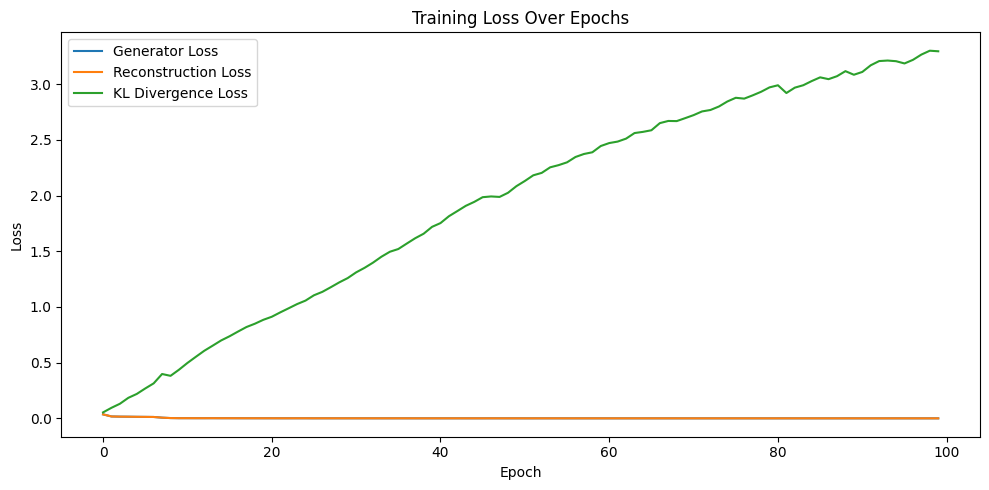

In [ ]:
@tf.function
def train_vae_step(model, x, optimizer, lstm_discriminator=None):
    with tf.GradientTape() as tape:
        x_reconstructed, mean, logvar = model(x)
        reconstruction_loss, kl_loss, total_kl_loss = compute_loss(model, x)
        
        if lstm_discriminator is not None:
            real_predictions = lstm_discriminator(tf.expand_dims(x, axis=0))
            fake_predictions = lstm_discriminator(tf.expand_dims(x_reconstructed, axis=0))
            discriminator_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions) +
                                              tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_predictions), fake_predictions))
            generator_loss = reconstruction_loss + model.beta * total_kl_loss + 0.1 * discriminator_loss
        else:
            generator_loss = reconstruction_loss + model.beta * total_kl_loss
    
    gradients = tape.gradient(generator_loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return generator_loss, reconstruction_loss, kl_loss

@tf.function
def train_lstm_step(lstm_model, real_data, generated_data, optimizer):
    with tf.GradientTape() as tape:
        real_predictions = lstm_model(real_data)
        generated_predictions = lstm_model(generated_data)
        real_loss = tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions)
        generated_loss = tf.keras.losses.binary_crossentropy(tf.zeros_like(generated_predictions), generated_predictions)
        total_loss = real_loss + generated_loss
    gradients = tape.gradient(total_loss, lstm_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, lstm_model.trainable_variables))
    return total_loss

def compute_loss(model, x):
    x_reconstructed, mean, logvar = model(x)
    reconstruction_loss_xy = tf.reduce_mean(tf.keras.losses.mse(x[:, :2], x_reconstructed[:, :2]))  # east, north
    reconstruction_loss_up = tf.reduce_mean(tf.keras.losses.mse(x[:, 2], x_reconstructed[:, 2]))  # up
    kl_loss = -0.5 * tf.reduce_mean(1 + logvar - tf.square(mean) - tf.exp(logvar))
    return reconstruction_loss_xy + reconstruction_loss_up, kl_loss, model.beta * kl_loss

lstm_discriminator = LSTMDiscriminator()
lstm_optimizer = tf.keras.optimizers.Adam(learning_rate)

batch_size = 512
train_datasets = [tf.data.Dataset.from_tensor_slices(data).shuffle(10000).batch(batch_size) 
                 for data in processed_data]

vae_epochs = 200
lstm_interval = 50
epochs = 100
visual_per_num_epoch = 20
num_augmented_files = 1

generator_loss_history = []
reconstruction_loss_history = []
kl_loss_history = []
nrmse_history = []

save_dir = "vae_models"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Training loop
for epoch in range(epochs):
    generator_loss = 0 
    reconstruction_loss_sum = 0
    kl_loss_sum = 0
    num_batches = sum(len(dataset) for dataset in train_datasets)

    with tqdm(total=num_batches, desc=f'Epoch {epoch+1}/{epochs}', unit='batch') as pbar:
        for dataset in train_datasets:
            for batch in dataset:
                use_lstm = epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0
                generator_loss_batch, reconstruction_loss, kl_loss = train_vae_step(
                    vae, batch, optimizer, 
                    lstm_discriminator if use_lstm else None
                )
                generator_loss += generator_loss_batch
                reconstruction_loss_sum += reconstruction_loss
                kl_loss_sum += kl_loss
                pbar.update(1)
                pbar.set_postfix({
                    'Generator Loss': float(generator_loss_batch),
                    'Reconstruction Loss': float(reconstruction_loss),
                    'KL Loss': float(kl_loss)
                })

    # Train LSTM at intervals
    if epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0:
        for data in processed_data:
            augmented_data = vae.decode(tf.random.normal(shape=(data.shape[0], latent_dim))).numpy()
            real_data = tf.expand_dims(data, axis=0)
            generated_data = tf.expand_dims(augmented_data, axis=0)
            lstm_loss = train_lstm_step(lstm_discriminator, real_data, generated_data, lstm_optimizer)
        print(f'LSTM training at epoch {epoch+1}: Discriminator Loss = {lstm_loss.numpy()}')

    # Calculate averages
    avg_generator_loss = generator_loss / num_batches
    avg_reconstruction_loss = reconstruction_loss_sum / num_batches
    avg_kl_loss = kl_loss_sum / num_batches

    # Update histories
    generator_loss_history.append(avg_generator_loss)
    reconstruction_loss_history.append(avg_reconstruction_loss)
    kl_loss_history.append(avg_kl_loss)

    # Print epoch summary
    print(f"Epoch {epoch+1}: Generator Loss = {avg_generator_loss:.6f}, "
          f"Reconstruction Loss = {avg_reconstruction_loss:.6f}, "
          f"KL Divergence Loss = {avg_kl_loss:.6f}")

    # Visualization and saving
    if (epoch + 1) % visual_per_num_epoch == 0:
        base_latent_variability = 100.0
        latent_variability_range = (0.1, 5.0)
        
        # Generate augmented data
        augmented_datasets = generate_augmented_data(
            vae, num_augmented_files, avg_data_points, processed_data,
            base_latent_variability, latent_variability_range
        )

        # Save model
        model_save_path = os.path.join(save_dir, f"epoch_{epoch+1}_model.h5")
        vae.save(model_save_path)
        print(f"VAE model saved at {model_save_path}")

# Save final model and plot history
vae.save('gps_vae_model.h5')
print("Final model saved.")

plt.figure(figsize=(10, 5))
plt.plot(generator_loss_history, label='Generator Loss')
plt.plot(reconstruction_loss_history, label='Reconstruction Loss')
plt.plot(kl_loss_history, label='KL Divergence Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.tight_layout()
plt.show()

# Generate Synthetic Data

Starting nested augmentation process...
Pretrained VAE model loaded.
Processing file 1...
Processing file 2...
Processing file 3...
Processing file 4...
Processing file 5...
Processing file 6...
Processing file 7...
Processing file 8...
Processing file 9...
Processing file 10...
Processing file 11...
Processing file 12...
Processing file 13...
Processing file 14...
Processing file 15...
Processing file 16...
Processing file 17...
Processing file 18...
Processing file 19...
Processing file 20...


C:\Users\Grimes\AppData\Local\Temp\ipykernel_9664\261948269.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


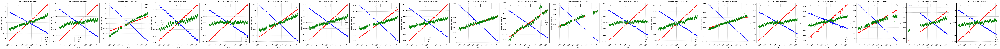


Processing Summary:
Number of processed files: 20
Average data points: 5525

Starting augmentation iteration 1
Augmented data saved to files/augmented_data\synthetic_BLAS.tenv3
Shape of augmented data for BLAS.tenv3: (5686, 3)
Augmented data saved to files/augmented_data\synthetic_DGJG.tenv3
Shape of augmented data for DGJG.tenv3: (5521, 3)
Augmented data saved to files/augmented_data\synthetic_DKSG.tenv3
Shape of augmented data for DKSG.tenv3: (5500, 3)
Augmented data saved to files/augmented_data\synthetic_HJOR.tenv3
Shape of augmented data for HJOR.tenv3: (6143, 3)
Augmented data saved to files/augmented_data\synthetic_HMBG.tenv3
Shape of augmented data for HMBG.tenv3: (5523, 3)
Augmented data saved to files/augmented_data\synthetic_HRDG.tenv3
Shape of augmented data for HRDG.tenv3: (5649, 3)
Augmented data saved to files/augmented_data\synthetic_JGBL.tenv3
Shape of augmented data for JGBL.tenv3: (5709, 3)
Augmented data saved to files/augmented_data\synthetic_JWLF.tenv3
Shape of a

C:\Users\Grimes\AppData\Local\Temp\ipykernel_9664\261948269.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


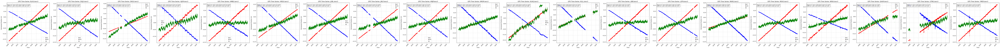

Augmented data saved to files/augmented_data\synthetic_BLAS.tenv3
Shape of augmented data for BLAS.tenv3: (5686, 3)
Augmented data saved to files/augmented_data\synthetic_DGJG.tenv3
Shape of augmented data for DGJG.tenv3: (5521, 3)
Augmented data saved to files/augmented_data\synthetic_DKSG.tenv3
Shape of augmented data for DKSG.tenv3: (5500, 3)
Augmented data saved to files/augmented_data\synthetic_HJOR.tenv3
Shape of augmented data for HJOR.tenv3: (6143, 3)
Augmented data saved to files/augmented_data\synthetic_HMBG.tenv3
Shape of augmented data for HMBG.tenv3: (5523, 3)
Augmented data saved to files/augmented_data\synthetic_HRDG.tenv3
Shape of augmented data for HRDG.tenv3: (5649, 3)
Augmented data saved to files/augmented_data\synthetic_JGBL.tenv3
Shape of augmented data for JGBL.tenv3: (5709, 3)
Augmented data saved to files/augmented_data\synthetic_JWLF.tenv3
Shape of augmented data for JWLF.tenv3: (5294, 3)
Augmented data saved to files/augmented_data\synthetic_KMJP.tenv3
Shape 

C:\Users\Grimes\AppData\Local\Temp\ipykernel_9664\261948269.py:122: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


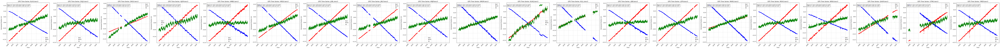

Augmented data saved to files/augmented_data\synthetic_BLAS.tenv3
Shape of augmented data for BLAS.tenv3: (5686, 3)
Augmented data saved to files/augmented_data\synthetic_DGJG.tenv3
Shape of augmented data for DGJG.tenv3: (5521, 3)
Augmented data saved to files/augmented_data\synthetic_DKSG.tenv3
Shape of augmented data for DKSG.tenv3: (5500, 3)
Augmented data saved to files/augmented_data\synthetic_HJOR.tenv3
Shape of augmented data for HJOR.tenv3: (6143, 3)
Augmented data saved to files/augmented_data\synthetic_HMBG.tenv3
Shape of augmented data for HMBG.tenv3: (5523, 3)
Augmented data saved to files/augmented_data\synthetic_HRDG.tenv3
Shape of augmented data for HRDG.tenv3: (5649, 3)
Augmented data saved to files/augmented_data\synthetic_JGBL.tenv3
Shape of augmented data for JGBL.tenv3: (5709, 3)
Augmented data saved to files/augmented_data\synthetic_JWLF.tenv3
Shape of augmented data for JWLF.tenv3: (5294, 3)
Augmented data saved to files/augmented_data\synthetic_KMJP.tenv3
Shape 

In [ ]:
def download_augmented_gps_data(all_augmented_data, augmented_datasets, scalers, 
                              original_data_frames, original_filenames, 
                              directory1='files/augmented_data', 
                              directory2='files/augmented_data_nested'):
    """Save augmented GPS data maintaining original GPS format"""
    if not os.path.exists(directory1):
        os.makedirs(directory1)
    if not os.path.exists(directory2):
        os.makedirs(directory2)

    gps_columns = ['site', 'YYMMMDD', 'yyyy.yyyy', '__MJD', 'week', 'd', 'reflon', 
                   '_e0(m)', '__east(m)', '____n0(m)', '_north(m)', 'u0(m)', 
                   '____up(m)', '_ant(m)', 'sig_e(m)', 'sig_n(m)', 'sig_u(m)', 
                   '__corr_en', '__corr_eu', '__corr_nu', '_latitude(deg)', 
                   '_longitude(deg)', '__height(m)']

    for i, (augmented_data, scaler, original_df, original_filename) in enumerate(
            zip(augmented_datasets, scalers, original_data_frames, original_filenames)):
            
        # Inverse transform the normalized coordinates
        augmented_coords = scaler.inverse_transform(augmented_data)
        
        # Ensure we don't exceed the length of original dates
        num_points = min(len(augmented_coords), len(original_df))
        
        # Create new DataFrame with same structure as original
        synthetic_df = original_df.copy() 
        
        # Update only the coordinate columns with synthetic data
        synthetic_df['__east(m)'] = augmented_coords[:num_points, 0].round(6)
        synthetic_df['_north(m)'] = augmented_coords[:num_points, 1].round(6)
        synthetic_df['____up(m)'] = augmented_coords[:num_points, 2].round(6)
        
        # Update reference positions
        synthetic_df['_e0(m)'] = synthetic_df['__east(m)'].round(0)
        synthetic_df['____n0(m)'] = synthetic_df['_north(m)'].round(0)
        synthetic_df['u0(m)'] = synthetic_df['____up(m)'].round(0)

        # Save files
        nested_filename = original_filename
        nested_file_path = os.path.join(directory2, nested_filename)
        
        augmented_filename = f"synthetic_{original_filename}"
        augmented_file_path = os.path.join(directory1, augmented_filename)

        # Write header
        header = 'site YYMMMDD yyyy.yyyy __MJD week d reflon _e0(m) __east(m) ____n0(m) _north(m) u0(m) ____up(m) _ant(m) sig_e(m) sig_n(m) sig_u(m) __corr_en __corr_eu __corr_nu _latitude(deg) _longitude(deg) __height(m)'
        
        # Save full format files
        with open(nested_file_path, 'w') as f:
            f.write(header + '\n')
            synthetic_df.to_csv(f, sep=' ', index=False, header=False,
                              float_format='%.6f',
                              columns=gps_columns)
            
        with open(augmented_file_path, 'w') as f:
            f.write(header + '\n')
            synthetic_df.to_csv(f, sep=' ', index=False, header=False,
                              float_format='%.6f',
                              columns=gps_columns)

        # Store the augmented coordinates
        all_augmented_data.append(augmented_coords)

        print(f"Augmented data saved to {augmented_file_path}")
        print(f"Shape of augmented data for {original_filename}: {augmented_coords.shape}")

def nested_augmentation(all_augmented_data, num_augmentations, pretrained_filename):
    """Perform nested augmentation for GPS time series"""
    print("Starting nested augmentation process...")
    
    try:
        # Load the pretrained model
        with custom_object_scope({'VAE': VAE}):
            pretrained_filepath = os.path.join("vae_models", pretrained_filename)
            vae_pretrained = load_model(pretrained_filepath)
        print("Pretrained VAE model loaded.")

        input_dir = os.path.join('dataset', 'train')
        data_frames, processed_data, scalers, avg_data_points, input_filenames, \
        original_data_frames = upload_and_process_files(input_dir)
        
        print(f"\nProcessing Summary:")
        print(f"Number of processed files: {len(processed_data)}")
        print(f"Average data points: {avg_data_points}")
        
        for iteration in range(num_augmentations):
            print(f"\nStarting augmentation iteration {iteration + 1}")
            
            if iteration > 0:
                directory = 'files/augmented_data_nested'
                data_frames, processed_data, scalers, avg_data_points, input_filenames, \
                original_data_frames = upload_and_process_files(directory)
            
            # Generate augmented data
            augmented_datasets = generate_augmented_data(
                vae_pretrained,
                len(data_frames),
                avg_data_points,
                processed_data,
                latent_variability_range=(0.1, 5.0)
            )
            
            # Clear nested directory for next iteration
            if os.path.exists('files/augmented_data_nested'):
                shutil.rmtree('files/augmented_data_nested')
            os.makedirs('files/augmented_data_nested')
            
            # Save augmented data
            download_augmented_gps_data(
                all_augmented_data,
                augmented_datasets,
                scalers,
                original_data_frames,
                input_filenames
            )
            
            print(f"Completed augmentation iteration {iteration + 1}")
        
        print("Nested augmentation process completed.")
        
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        print("\nFull error traceback:")
        print(traceback.format_exc())
    
    finally:
        # Clean up nested directory
        if os.path.exists('files/augmented_data_nested'):
            shutil.rmtree('files/augmented_data_nested')
            print("Cleaned up augmented_data_nested directory")

# Initialize list to store all augmented data
all_augmented_data = []

# Run nested augmentation
nested_augmentation(all_augmented_data, num_augmentations=3, pretrained_filename='epoch_100_model.h5')

# Visualize Augmented Data

C:\Users\Grimes\AppData\Local\Temp\ipykernel_9664\2438344764.py:110: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


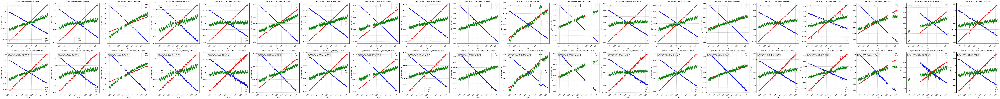

In [ ]:
def visualize_original_and_augmented(original_dir, augmented_dir):
    """
    Visualize and compare original and augmented GPS time series
    Args:
        original_dir: Directory containing original GPS data
        augmented_dir: Directory containing augmented GPS data
    """
    # Get original and synthetic files
    original_files = [f for f in os.listdir(original_dir) if f.endswith('.tenv3')]
    synthetic_files = [f for f in os.listdir(augmented_dir) if f.startswith('synthetic_')]
    
    # Match original files with their synthetic counterparts
    matched_files = []
    for orig_file in original_files:
        synth_file = f"synthetic_{orig_file}"
        if synth_file in synthetic_files:
            matched_files.append((orig_file, synth_file))
    
    num_pairs = len(matched_files)
    if num_pairs == 0:
        raise ValueError("No matching original-synthetic file pairs found")
        
    # Create figure with two rows: original and synthetic
    fig, axs = plt.subplots(2, num_pairs, figsize=(6*num_pairs, 12), constrained_layout=True)
    
    for i, (orig_file, synth_file) in enumerate(matched_files):
        # Load and plot original data
        orig_path = os.path.join(original_dir, orig_file)
        with open(orig_path, 'r') as f:
            header = f.readline().strip()
        column_names = header.split()
        orig_df = pd.read_csv(orig_path, skiprows=1, sep=r'\s+', names=column_names)
        
        # Calculate mean positions for original
        east_mean_orig = orig_df['__east(m)'].mean()
        north_mean_orig = orig_df['_north(m)'].mean()
        up_mean_orig = orig_df['____up(m)'].mean()
        
        # Create datetime index for original
        orig_df['date'] = pd.to_datetime(orig_df['YYMMMDD'], format='%y%b%d')
        
        # Plot original data
        axs[0, i].scatter(orig_df['date'], orig_df['__east(m)'] - east_mean_orig,
                         c='blue', s=2, alpha=0.6, label='East')
        axs[0, i].scatter(orig_df['date'], orig_df['_north(m)'] - north_mean_orig,
                         c='red', s=2, alpha=0.6, label='North')
        axs[0, i].scatter(orig_df['date'], orig_df['____up(m)'] - up_mean_orig,
                         c='green', s=2, alpha=0.6, label='Up')
        
        # Load and plot synthetic data
        synth_path = os.path.join(augmented_dir, synth_file)
        synth_df = pd.read_csv(synth_path, skiprows=1, sep=r'\s+', names=column_names)
        
        # Calculate mean positions for synthetic
        east_mean_synth = synth_df['__east(m)'].mean()
        north_mean_synth = synth_df['_north(m)'].mean()
        up_mean_synth = synth_df['____up(m)'].mean()
        
        # Create datetime index for synthetic
        synth_df['date'] = pd.to_datetime(synth_df['YYMMMDD'], format='%y%b%d')
        
        # Plot synthetic data
        axs[1, i].scatter(synth_df['date'], synth_df['__east(m)'] - east_mean_synth,
                         c='blue', s=2, alpha=0.6, label='East')
        axs[1, i].scatter(synth_df['date'], synth_df['_north(m)'] - north_mean_synth,
                         c='red', s=2, alpha=0.6, label='North')
        axs[1, i].scatter(synth_df['date'], synth_df['____up(m)'] - up_mean_synth,
                         c='green', s=2, alpha=0.6, label='Up')
        
        # Customize original plot
        axs[0, i].set_title(f'Original GPS Time Series: {orig_file}')
        axs[0, i].set_xlabel('Time')
        axs[0, i].set_ylabel('Demeaned Position (m)')
        axs[0, i].grid(True, linestyle='--', alpha=0.7)
        axs[0, i].legend()
        plt.setp(axs[0, i].get_xticklabels(), rotation=45)
        
        # Add statistical information for original
        orig_stats = (f'Mean (m) - East: {east_mean_orig:.3f}, North: {north_mean_orig:.3f}, Up: {up_mean_orig:.3f}\n'
                     f'RMS (m) - East: {np.sqrt(np.mean((orig_df["__east(m)"] - east_mean_orig)**2)):.3f}, '
                     f'North: {np.sqrt(np.mean((orig_df["_north(m)"] - north_mean_orig)**2)):.3f}, '
                     f'Up: {np.sqrt(np.mean((orig_df["____up(m)"] - up_mean_orig)**2)):.3f}')
        
        axs[0, i].text(0.02, 0.95, orig_stats,
                      transform=axs[0, i].transAxes,
                      fontsize=8,
                      verticalalignment='top',
                      bbox=dict(facecolor='white', alpha=0.8))
        
        # Customize synthetic plot
        axs[1, i].set_title(f'Synthetic GPS Time Series: {synth_file}')
        axs[1, i].set_xlabel('Time')
        axs[1, i].set_ylabel('Demeaned Position (m)')
        axs[1, i].grid(True, linestyle='--', alpha=0.7)
        axs[1, i].legend()
        plt.setp(axs[1, i].get_xticklabels(), rotation=45)
        
        # Add statistical information for synthetic
        synth_stats = (f'Mean (m) - East: {east_mean_synth:.3f}, North: {north_mean_synth:.3f}, Up: {up_mean_synth:.3f}\n'
                      f'RMS (m) - East: {np.sqrt(np.mean((synth_df["__east(m)"] - east_mean_synth)**2)):.3f}, '
                      f'North: {np.sqrt(np.mean((synth_df["_north(m)"] - north_mean_synth)**2)):.3f}, '
                      f'Up: {np.sqrt(np.mean((synth_df["____up(m)"] - up_mean_synth)**2)):.3f}')
        
        axs[1, i].text(0.02, 0.95, synth_stats,
                      transform=axs[1, i].transAxes,
                      fontsize=8,
                      verticalalignment='top',
                      bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()

original_dir = 'dataset/train'  # Directory with original .tenv3 files
augmented_dir = 'files/augmented_data'  # Directory with synthetic files
visualize_original_and_augmented(original_dir, augmented_dir)